In [1]:
# Standard library imports
import os
import sys
import time
import gzip
import glob
import pickle
from tqdm import tqdm

# Third-party library imports
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.font_manager as font_manager
import matplotlib.patches as mpatches
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import umap
import PyPDF2
from natsort import natsorted
import random
import math

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy
from scipy.spatial import distance
from scipy.stats import pearsonr
import scipy.stats
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, mutual_info_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.decomposition import PCA

# Local application/library specific imports
sys.path.append('/net/seq/data2/projects/aabisheva/Encode/my_ipynb/Vocabulary')
import OONMF
import OONMFhelpers
from OONMFhelpers import get_barsortorder

/home/aabisheva/anaconda3/envs/nmf/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/aabisheva/anaconda3/envs/nmf/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/aabisheva/anaconda3/envs/nmf/lib/python3.11/site-packages/umap/d

In [2]:
# Set directory and styles
os.chdir("/net/seq/data2/projects/aabisheva/Encode/my_ipynb/")
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_style("white")
cmap = cm.get_cmap('tab10')

/tmp/ipykernel_22898/3259779216.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


In [3]:
import matplotlib.font_manager as fm
font_path = '/net/seq/data2/projects/aabisheva/Encode/my_ipynb/ARIAL.TTF'
if os.path.isfile(font_path):
    arial_font = fm.FontProperties(fname=font_path)
else:
    print(f"Font file not found: {font_path}")

# Plotting functions

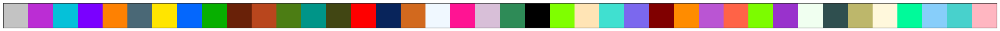

In [4]:
# Just color scheme inicialization

n_components = 40

colors_order = ['#FFE500', '#FE8102', '#FF0000', '#07AF00', '#4C7D14', '#414613', '#05C1D9', '#0467FD', '#009588', '#BB2DD4', '#7A00FF', '#4A6876', '#08245B', '#B9461D', '#692108', '#C3C3C3']
neworder = np.array([16,10,7,11,2,12,1,8,4,15,14,5,9,6,3,13]).astype(int) - 1
colors_order = list(np.array(colors_order)[neworder])

# THEN HERE IS A LOT WEIRD CODE TO SELECT COLORS
# Get colors for those indices from the existing random selection
colornames = np.sort(list(mcolors.CSS4_COLORS.keys()))
np.random.seed(10)
for _ in range(23):  
    newcolor = colornames[np.random.randint(len(colornames))]
    trialcount = 0
    while ((newcolor in colors_order) and (trialcount < 100)):
        newcolor = colornames[np.random.randint(0, len(colornames))]
        trialcount += 1
    colors_order.append(newcolor)

# Keep the colors you want
additional_indices = [19, 25, 26, 30, 39]
modified_colors = colors_order[:16]
for idx in additional_indices:
    modified_colors.append(colors_order[idx - 1])
modified_colors.extend(["black", "chartreuse", "moccasin"])

# Add random colors until the list has 40 colors
num_colors_to_add = n_components - len(modified_colors)
for _ in range(num_colors_to_add):
    newcolor = colornames[np.random.randint(len(colornames))]
    trialcount = 0
    while ((newcolor in modified_colors) and (trialcount < 100)):
        newcolor = colornames[np.random.randint(0, len(colornames))]
        trialcount += 1
    modified_colors.append(newcolor)
    
colors_order = modified_colors

# just for checking colors
fig, ax = plt.subplots(figsize=(len(modified_colors), 1))
# Draw a rectangle for each color in the list
for i, color in enumerate(modified_colors):
    rect = plt.Rectangle((i, 0), 1, 1, facecolor=color, edgecolor='none')
    ax.add_patch(rect)
ax.set_xlim(0, len(modified_colors))
ax.set_ylim(0, 1)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal')

plt.show()

In [5]:
def define_colors(self, reordercolors=False):
    maxassigned = 40
    self.Comp_colors = ['#C3C3C3', '#BB2DD4', '#05C1D9', '#7A00FF', '#FE8102', '#4A6876', '#FFE500', '#0467FD', '#07AF00', '#692108', '#B9461D', '#4C7D14', '#009588', '#414613', '#FF0000', '#08245B', 'chocolate', 'aliceblue', 'deeppink', 'thistle', 'seagreen', 'black', 'chartreuse', 'moccasin']

    if (self.Ncomps>maxassigned):
        # somewhat defunct but whatever. Adds extra "random" colors if you use more than 16 
        from matplotlib import colors as mcolors
        colornames = np.sort(list(mcolors.CSS4_COLORS.keys()))
        count = maxassigned
        np.random.seed(10)
        myrandint = np.random.randint(len(colornames))
        while (count < self.Ncomps):
            myrandint =    np.random.randint(len(colornames))
            newcolor = colornames[myrandint]
            trialcount = 0
            while ((newcolor in self.Comp_colors) and (trialcount < 100)):
                print('what am i doing here')
                newcolor = colornames[np.random.randint(0,len(colornames))]
                trialcount+=1
            print('new color ',count,newcolor)
            self.Comp_colors.append(newcolor)
            count+=1    
                
OONMF.NMFobject.define_colors = define_colors

In [6]:
def make_continuous_stacked_bar_plot_sorted(self, Nrelevant, BarMatrix, bargraph_out, names=[], barsortorder=[], plot_title='', figdim1=150, figdim2=40):
    if len(barsortorder) < 1:
        barsortorder = np.arange(Nrelevant)

    if len(names) < 1:
        names = [str(i) for i in range(Nrelevant)]
        names = np.array(names)

    start = 0
    end = Nrelevant
    Xpositions = np.linspace(0, Nrelevant, Nrelevant, endpoint=False)

    self.define_colors()

    plt.clf()
    plt.figure(figsize=(figdim1, figdim2))

    for column in range(Nrelevant):
        ground_pSample = 0
        bar_heights = BarMatrix[:, start:end].T[barsortorder][column]
        indices = np.flip(np.argsort(bar_heights))
        sorted_heights = bar_heights[indices]
        colours = [self.Comp_colors[i] for i in indices]

        for component in range(self.Ncomps):
            plt.fill_between([Xpositions[column], Xpositions[column] + 1], ground_pSample, ground_pSample + sorted_heights[component], color=colours[component])
            ground_pSample = ground_pSample + sorted_heights[component]

    OONMFhelpers.increase_axis_fontsize()

    plt.ylabel('sum of signal in matrix', fontsize=70)
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / Nrelevant)**0.5 * 130
    thebottom = min([(1 / Nrelevant)**0.3 * 1.2, 0.3])

    plt.xticks(np.arange(0, Nrelevant, step=max(1, Nrelevant//10)), rotation='vertical', fontsize=samplenamesize)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=thebottom)
    plt.savefig(bargraph_out)
    plt.show()
    plt.close()

OONMF.NMFobject.make_continuous_stacked_bar_plot_sorted = make_continuous_stacked_bar_plot_sorted


In [7]:
def make_stacked_bar_plot_sorted_horisontal(self, Nrelevant, BarMatrix, bargraph_out, names=[], barsortorder=[], plot_title='', figdim1=150, figdim2=40):
    if len(barsortorder) < 1:
        barsortorder = np.arange(Nrelevant)

    if len(names) < 1:
        names = [str(i) for i in range(Nrelevant)]
        names = np.array(names)

    start = 0
    end = Nrelevant
    Ypositions = np.arange(Nrelevant)

    self.define_colors()

    plt.clf()
    plt.figure(figsize=(figdim2, figdim1))  # switched figdim1 and figdim2

    for row in range(Nrelevant):
        ground_pSample = 0
        bar_widths = BarMatrix[:, start:end].T[barsortorder][row]
        indices = np.flip(np.argsort(bar_widths))
        # indices = np.arange(self.Ncomps)
        sorted_widths = bar_widths[indices]
        colours = [self.Comp_colors[i] for i in indices]

        for component in range(self.Ncomps):
            plt.barh(Ypositions[row], sorted_widths[component], left=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(sorted_widths[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.xlabel('sum of signal in matrix', fontsize=70)  # changed ylabel to xlabel
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / Nrelevant)**0.5 * 130
    thebottom = min([(1 / Nrelevant)**0.3 * 1.2, 0.3])

    plt.yticks(Ypositions, names[barsortorder], fontsize=samplenamesize)  # changed xticks to yticks
    plt.subplots_adjust(left=thebottom, right=0.9, top=0.9, bottom=0.1)  # adjusted the left parameter

    plt.savefig(bargraph_out)
    plt.show()
    plt.close()

OONMF.NMFobject.make_stacked_bar_plot_sorted_horisontal = make_stacked_bar_plot_sorted_horisontal

In [8]:
def barsortorder_all_components(BarMatrix):
    bar_indices = np.empty(BarMatrix.T.shape)
    for i, bar in enumerate(BarMatrix):
        np.copyto(bar_indices[:, i], np.flip(np.argsort(bar)))
    return np.lexsort(np.flip(bar_indices, 0))

In [9]:
def get_bar_indices_by_leading_components(BarMatrix, component1, component2):
    if component1 == component2:
        raise ValueError("Components cannot have the same value!")
    fitting_indices = []
    for i, bar in enumerate(BarMatrix):
        if np.flip(np.argsort(bar)).tolist()[:2] == [component1, component2]:
            fitting_indices.append(i)
    return fitting_indices

In [10]:
def make_stacked_bar_plot_two_components(self, BarMatrix, comp_indices, bargraph_out, names=[], plot_title='', figdim1=150, figdim2=40):
    if len(names) < 1:
        names = [str(i) for i in range(BarMatrix.shape[0])]
        names = np.array(names)

    plt.clf()
    plt.figure(figsize=(figdim2, figdim1))  # switched figdim1 and figdim2

    relevant_bars = BarMatrix[comp_indices, :]
    Ypositions = np.arange(relevant_bars.shape[0])

    for i, row in enumerate(relevant_bars):
        ground_pSample = 0
        indices = np.flip(np.argsort(row))
        sorted_widths = row[indices]
        colours = [self.Comp_colors[i] for i in indices]

        for component in range(self.Ncomps):
            plt.barh(Ypositions[i], sorted_widths[component], left=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(sorted_widths[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.xlabel('sum of signal in matrix', fontsize=70)  # changed ylabel to xlabel
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / relevant_bars.shape[0])**0.5 * 200
    thebottom = min([(1 / relevant_bars.shape[0])**0.3 * 1.2, 0.3])

    plt.yticks(Ypositions, names[comp_indices], fontsize=samplenamesize)  # changed xticks to yticks
    plt.subplots_adjust(left=thebottom, right=0.9, top=0.9, bottom=0.1)  # adjusted the left parameter

    plt.savefig(bargraph_out)
    plt.show()
    plt.close()

OONMF.NMFobject.make_stacked_bar_plot_two_components = make_stacked_bar_plot_two_components

In [11]:
# the new one

def make_stacked_bar_plot_two_components(self, BarMatrix, comp_indices, bargraph_out, names=[], plot_title='', figdim1=150, figdim2=40, *, grouped_by_components=False):
    if len(names) < 1:
        names = [str(i) for i in range(BarMatrix.shape[0])]
        names = np.array(names)

    plt.clf()
    plt.figure(figsize=(figdim2, figdim1))

    relevant_bars = BarMatrix[comp_indices, :]
    Ypositions = np.arange(relevant_bars.shape[0])

    # Sort the components inside every bar
    sorted_bars = np.empty(relevant_bars.shape)
    sorted_colors = []
    sorting_indices = np.empty(relevant_bars.shape, dtype=np.int_)
    for i, bar in enumerate(relevant_bars):
        indices = np.flip(np.argsort(bar))
        sorted_widths = bar[indices]
        sorted_bars[i] = sorted_widths
        sorting_indices[i] = indices
        sorted_colors.append([self.Comp_colors[j] for j in indices])

    sorted_order = np.lexsort(np.flip(sorted_bars, axis=1).T)

    # Can't use numpy indices for lists, so have to sort manually
    sorted_colors_sorted = []
    for i in sorted_order:
        sorted_colors_sorted.append(sorted_colors[i])
    sorted_colors = sorted_colors_sorted

    sorted_bars = sorted_bars[sorted_order]
    sorting_indices = sorting_indices[sorted_order]

    if grouped_by_components:
        grouped_order = np.lexsort(np.flip(sorting_indices[:, :4], axis=1).T)

        sorted_bars = sorted_bars[grouped_order]
        sorting_indices = sorting_indices[grouped_order]
        sorted_colors_sorted = []
        for i in grouped_order:
            sorted_colors_sorted.append(sorted_colors[i])
        sorted_colors = sorted_colors_sorted

    for i, row in enumerate(sorted_bars):
        ground_pSample = 0
        colours = sorted_colors[i]

        for component in range(self.Ncomps):
            plt.barh(Ypositions[i], row[component], left=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(row[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.xlabel('sum of signal in matrix', fontsize=70)  # changed ylabel to xlabel
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / relevant_bars.shape[0])**0.5 * 200
    thebottom = min([(1 / relevant_bars.shape[0])**0.3 * 1.2, 0.3])

    names = names[comp_indices][sorted_order]
    if grouped_by_components:
        names = names[grouped_order]
    plt.yticks(Ypositions, names, fontsize=samplenamesize)  # changed xticks to yticks
    plt.subplots_adjust(left=thebottom, right=0.9, top=0.9, bottom=0.1)  # adjusted the left parameter

    plt.savefig(bargraph_out)
    plt.show()
    plt.close()

OONMF.NMFobject.make_stacked_bar_plot_two_components = make_stacked_bar_plot_two_components

# Plotting

In [12]:
# Specifing input and output folders
dir_path_pipeline = "/net/seq/data2/projects/aabisheva/Encode/nextflow_results/nmf_results/"
dir_path_figures = "/net/seq/data2/projects/aabisheva/Encode/nextflow_results/figures/"
data_slice_size = "full"
methods_range = ["unweight"]

In [23]:
full_bin =  np.load('/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/output/binary.filtered.matrix.modified.npy')

In [13]:
with open('/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/output/indivs_order.txt', 'r') as f:
    sample_names = f.read().strip().split('\t')

# Read the metadata table
metadata_file = '/net/seq/data2/projects/ENCODE4Plus/indexes/index_altius_23-05-11/metadata/ENCODE4plus_master_metadata_for_analysis.tsv'
metadata = pd.read_csv(metadata_file, sep='\t')

# Set 'id' as the index
metadata.set_index('id', inplace=True)

# Filter and reorder the rows based on sample names
metadata = metadata.loc[sample_names]

# Reset the index
metadata.reset_index(inplace=True)

metadata

,id,tc_number,ds_number,ln_number,passed_agg_qc,hotspot1_spot,hotspot2_spot,nuclear_percent_duplication,taxonomy_name,ontology_id,...,nf_subsampled_spot1,dedupped_subsampled_spot1,dupRate_5M,library_kit,ln,nuclear_aligned,total_aligned,alignment_quality,dhsCounts_AllSamplesIndex,read_depth
0,AG80796,6419,DS12393,LN2503,YES,0.5689,0.4299,21.6078,CMK,EFO:0003037,...,0.5387,0.4431,0.078924,PE,LN2503,32730192.0,60738773.0,0.538868,68501.0,32693071.0
1,AG72371,21827,DS100247,LN82384A,YES,0.5158,0.4065,23.4548,h.HCT116.CDK7,EFO:0002824,...,0.5055,0.4884,0.028639,ThruPLEX DNA-seq Kit,LN82384A,97125448.0,130506912.0,0.744217,65376.0,97056200.0
2,AG81543,1057,DS38746,LN32943A,YES,0.3107,0.2338,5.1937,h.KASUMI-1,EFO:0006607,...,0.3110,0.3027,0.009148,SSlib-JV7Q,LN32943A,70296634.0,127108972.0,0.553042,91619.0,70230350.0
3,AG81555,1054,DS38656,LN32851A,NO,0.2935,0.2035,14.7722,h.KASUMI-1,EFO:0006607,...,0.2939,0.2759,0.030704,SSlib-JV7Q,LN32851A,55472874.0,91384032.0,0.607030,71619.0,55425579.0
4,AG80699,6975,DS14323,LN3036,YES,0.6416,0.4020,18.2760,h.WI-38,EFO:0001260,...,0.6004,0.5361,0.067307,PE,LN3036,24984098.0,34253236.0,0.729394,60925.0,24965490.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3775,AG6933,7523,DS39312,LN42983C,NO,0.2594,0.1888,12.8734,h.smooth muscle cell,CL:0000192,...,0.2588,0.2524,0.005988,Thruplex DNA-Seq H,LN42983C,242141104.0,293510790.0,0.824982,134383.0,210615155.0
3776,AG80385,6198,DS20493,LN4859,YES,0.6654,0.7099,24.2645,M059J,EFO:0005697,...,0.6664,0.5916,0.033388,TS,LN4859,363395028.0,493931604.0,0.735719,286727.0,362549906.0
3777,AG80384,6198,DS20497,LN4860,YES,0.6946,0.5915,27.2915,M059J,EFO:0005697,...,0.6561,0.5622,0.064872,TS,LN4860,50070307.0,63571471.0,0.787622,122558.0,45398379.0
3778,AG72440,11355,DS76812,LN60001A,YES,0.3483,0.1815,7.8514,h.PGP1.iPSC,EFO:0007950,...,0.3365,0.3320,0.004798,ThruPLEX DNA-seq Kit,LN60001A,165515930.0,194223517.0,0.852193,89072.0,164051090.0


In [14]:
# Removing extra samples

with open('/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/high_coverage_unresolved_datasets.txt', 'r') as file:
    samples_list = [line.strip() for line in file]
samples_count = len(samples_list)
print(f'There are {samples_count} samples in the list.')

# Check if all samples are present in the dataframe
samples_present = metadata['id'].isin(samples_list).sum()
print(f'{samples_present} out of {samples_count} samples are present in the dataframe.')

if samples_present == samples_count:
    print('All samples are present in the dataframe.')
else:
    missing_samples = set(samples_list) - set(metadata['id'].tolist())
    print(f'Missing samples: {", ".join(missing_samples)}')

There are 328 samples in the list.
328 out of 328 samples are present in the dataframe.
All samples are present in the dataframe.


In [15]:
indices_to_remove = metadata[metadata['id'].isin(samples_list)].index.tolist()
metadata = metadata.drop(indices_to_remove)

In [16]:
allnames = metadata['taxonomy_name'].to_list()

In [17]:
metadata.columns

Index(['id', 'tc_number', 'ds_number', 'ln_number', 'passed_agg_qc',
       'hotspot1_spot', 'hotspot2_spot', 'nuclear_percent_duplication',
       'taxonomy_name', 'ontology_id', 'ontology_term', 'disease_pathology',
       'sampling_origin', 'state', 'growth_stage', 'system', 'subsystem',
       'organ', 'organ_region', 'cell_type', 'immune_cells_subtype',
       't_cells_subpopulation', 'cell_markers', 'side_position', 'germ_layer',
       'description', 'donor_id', 'donor_age', 'donor_age_units', 'donor_sex',
       'donor_ethnicity', 'donor_health_condition', 'vendor_name',
       'perturbation', 'treatment_name', 'treatment_details', 'dose',
       'dose_units', 'filtered_alignments_bam', 'bam_index', 'hotspot_peaks',
       'hotspot_peaks_1per', 'hotspot_peaks_point1per', 'footprint', 'adapter',
       'total_alignments', 'all_aligned', 'all_mapq_filter', 'autosomal_align',
       'chr_m', 'hotspot1_num_bases', 'hotspot1_num_spots',
       'hotspot2_num_bases', 'hotspot2_num_spo

In [18]:
np.unique(metadata["organ"].to_list()) 

array(['Adrenal gland', 'Amnion', 'Bladder', 'Blood', 'Bone',
       'Bone marrow', 'Brain', 'Colon', 'Esophagus', 'Eye', 'Face',
       'Germ', 'Gonad', 'Gum', 'Heart', 'Kidney', 'Large intestine',
       'Limb', 'Liver', 'Lung', 'Mammary', 'Muscle', 'Ovary', 'Pancreas',
       'Periodontal ligament', 'Placenta', 'Prostate', 'Pulmonary artery',
       'Skin', 'Small intestine', 'Spinal cord', 'Spleen', 'Stomach',
       'Stroma', 'Testis', 'Thymus', 'Thyroid gland', 'Tongue',
       'Umbilical', 'Uterus', 'Vascular', 'nan'], dtype='<U32')

In [19]:
np.unique(metadata["system"].to_list()) 

array(['Cardiovascular', 'Connective', 'Digestive', 'Embryonic',
       'Endocrine', 'Epithelial', 'Fetal life support', 'Germ',
       'Hematopoietic', 'Hepatic', 'Integumentary', 'Musculoskeletal',
       'Nervous', 'Reproductive', 'Respiratory', 'Urinary'], dtype='<U18')

In [20]:
np.unique(metadata["state"].to_list()) 

array(['Cell line', 'Primary', 'Stem cells', 'nan'], dtype='<U32')

In [21]:
np.unique(metadata["cell_type"].to_list()) 

array(['Adipocyte', 'Astrocyte', 'B-cell', 'Cardiomyocyte', 'Endothelial',
       'Epithelial-like cancer cell', 'Erythroblast', 'Fibroblast',
       'Glial', 'Hepatocyte', 'Inflammatory macrophage', 'Keratinocyte',
       'Lactocyte', 'Lymphoblast', 'Macrophage', 'Megakaryoblast',
       'Melanocyte', 'Mesodermal', 'Monocyte', 'Myeloblast',
       'Myeloid dendritic cell', 'Myeloid progenitor', 'Myoblast',
       'Myocyte', 'Myotube', 'Natural killer cell', 'Neuroblast',
       'Neuron', 'Pericyte', 'Podocyte', 'Progenitor', 'Promyeloblast',
       'Smooth muscle cells', 'Stem cell', 'Suppressor macrophage',
       'T-cell', 'Trophoblast', 'Type 2 pneumocyte', 'nan'], dtype='<U32')

## Plotting samples

In [121]:
NC_ar = [24]

for method in methods_range:
    for n_components in NC_ar:
        print("METHOD: ", method, " N_components: ", n_components)
        
        prefix = "bin_modified_" + method + "_" + str(data_slice_size)+'.'+ str(n_components)
        
        # Data loading
        decomp = OONMF.NMFobject(n_components)
        decomp.matrix_input_name(dir_path_pipeline + prefix +'.W.npy', 
                                 dir_path_pipeline + prefix +'.H.npy')
        decomp.read_matrix_input(compressed=False)
        print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)
        
        
        decomp.normalize_matrices()
        bar_graph_sort_order = get_barsortorder(decomp.NormedBasis)
        decomp.define_colors()
        

METHOD:  unweight  N_components:  24
(3452, 24) (24, 4230461) matrixes loaded for n_components 24


In [ ]:
plt.style.use('seaborn-v0_8-whitegrid')
# Normolized stacked barplot
decomp.make_continuous_stacked_bar_plot_sorted(decomp.NormedBasis.shape[0], 
                 decomp.NormedBasis.T, 
                 dir_path_figures + prefix + '.stacked_bar_plot.normed.pdf', 
                 names=np.array(allnames), 
                 barsortorder=bar_graph_sort_order)

<Figure size 640x480 with 0 Axes>

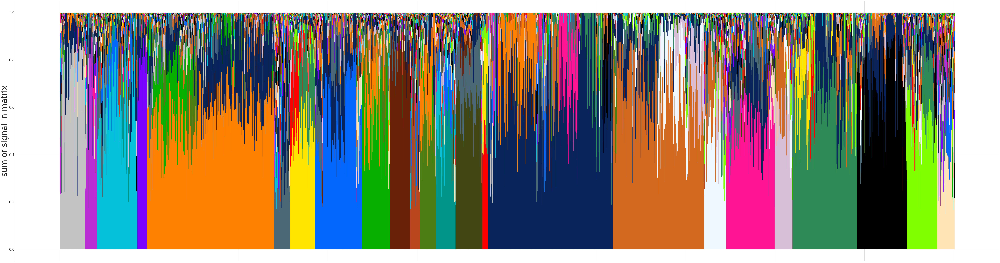

In [31]:
new_bar_sort_order = barsortorder_all_components(decomp.NormedBasis)

# Normolized stacked barplot -- grouped by similar second and other components
decomp.make_continuous_stacked_bar_plot_sorted(decomp.Basis.shape[0], 
                     decomp.NormedBasis.T, 
                     dir_path_figures + prefix + '.stacked_bar_plot.normed.grouped.pdf', 
                     names=np.array(allnames), 
                     barsortorder=new_bar_sort_order)

Number of samples for component 0: 98
Number of samples for component 1: 45
Number of samples for component 2: 157
Number of samples for component 3: 36
Number of samples for component 4: 492
Number of samples for component 5: 62
Number of samples for component 6: 94
Number of samples for component 7: 183
Number of samples for component 8: 106
Number of samples for component 9: 80
Number of samples for component 10: 37
Number of samples for component 11: 63
Number of samples for component 12: 74
Number of samples for component 13: 104
Number of samples for component 14: 22
Number of samples for component 15: 481
Number of samples for component 16: 353
Number of samples for component 17: 85
Number of samples for component 18: 186
Number of samples for component 19: 69
Number of samples for component 20: 248
Number of samples for component 21: 194
Number of samples for component 22: 117
Number of samples for component 23: 66


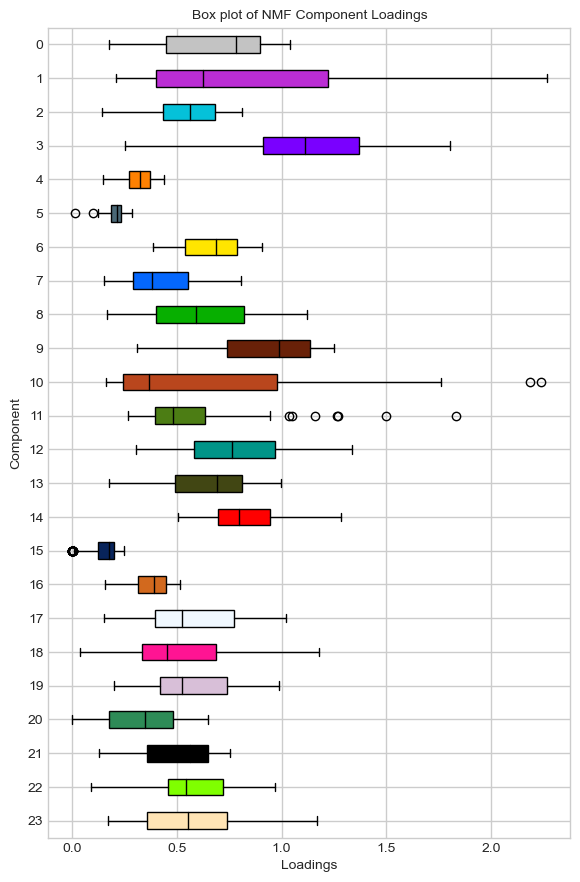

In [77]:
plt.style.use('seaborn-v0_8-whitegrid')
n_components = decomp.Basis.shape[1]
component_loadings = []
comp_colors = decomp.Comp_colors

for i_component in range(n_components):
    max_loaded = np.argmax(decomp.Basis, axis=1) == i_component
    print(f"Number of samples for component {i_component}: {np.sum(max_loaded)}")
    component_loadings.append(decomp.Basis[max_loaded, i_component])

# Reverse the order of component_loadings and comp_colors
component_loadings = component_loadings[::-1]
comp_colors = comp_colors[::-1]

fig, ax = plt.subplots(figsize=(6, 10))
bp = ax.boxplot(component_loadings, widths=0.5, whis=1.5, patch_artist=True, vert=False, medianprops=dict(color='black'))

# Color the boxes
for i, box in enumerate(bp['boxes']):
    box.set_facecolor(comp_colors[i])

ax.set_yticklabels([f'{i}' for i in range(n_components-1, -1, -1)], fontproperties=arial_font)
ax.set_xlabel('Loadings', fontproperties=arial_font)
ax.set_ylabel('Component', fontproperties=arial_font)
plt.title('Box plot of NMF Component Loadings', fontproperties=arial_font)
plt.grid(True)

for label in ax.get_xticklabels():
    label.set_fontproperties(arial_font)
for label in ax.get_yticklabels():
    label.set_fontproperties(arial_font)

plt.savefig(dir_path_figures + prefix +'.boxplot.component_loading.pdf', bbox_inches='tight')
plt.show()


Number of samples in this category  98
0
['h.brain.cerebellar.hemisphere' 'h.brain.cerebellar.hemisphere'
 'h.brain.cerebellar.hemisphere' 'h.brain.cerebellar.hemisphere'
 'h.brain.cerebellar.hemisphere' 'h.brain' 'h.brain.cerebellar.hemisphere'
 'h.brain' 'h.brain.cerebellar.hemisphere' 'h.brain.cerebellar.hemisphere'
 'h.brain.cerebellar.hemisphere' 'h.brain.cerebellar.hemisphere'
 'h.brain.cerebellar.hemisphere' 'h.brain.cerebellar.hemisphere'
 'h.brain.cerebellar.hemisphere']
Number of samples in this category  45
1
['h.NCI-H524' 'h.NCI-H524' 'h.NCI-H82' 'h.NCI-H524' 'h.NCI-H524'
 'h.NCI-H82' 'h.NCI-H524' 'h.NCI-H524' 'h.NCI-H524' 'h.NCI-H524'
 'h.NCI-H524' 'h.NCI-H524' 'h.NCI-H524' 'h.NCI-H524' 'h.NCI-H524']
Number of samples in this category  157
2
['h.EH' 'SKMC' 'fSkin Fibroblast' 'IMR90' 'AG09309' 'GM04504A' 'AG09309'
 'fSkin Fibroblast' 'HNPCEpiC' 'h.BMEC' 'fSkin Fibroblast' 'BJ' 'h.BMEC'
 'fSkin Fibroblast' 'NHLF']
Number of samples in this category  36
3
['h.NCI-H526' 'h.NCI

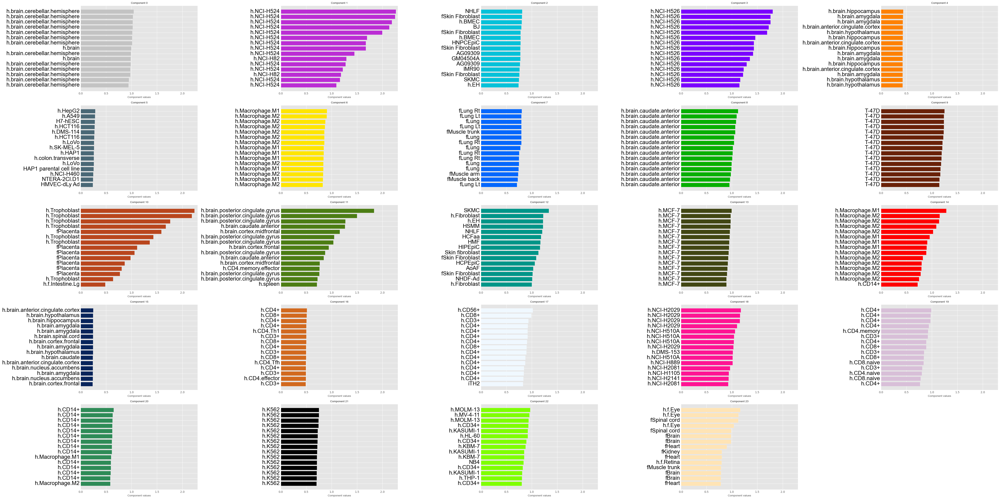

In [123]:
### Iterpretation part
plt.style.use('ggplot')
# Determine the number of rows and columns for the subplots
ncols = int(np.ceil(np.sqrt(n_components)))
nrows = int(np.ceil(n_components / ncols))

# Create a figure with subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
axes = axes.flatten()  # Flatten the axes array to easily loop through

for i_component in range(n_components):
    # Plot i_component major
    green_cut = np.argmax(decomp.Basis, axis=1) == i_component
    print("Number of samples in this category ", len(green_cut[green_cut]))

    if len(green_cut[green_cut]) >= 10: # if not, there are too few samples to count 10% top
        # Plot top 10% of this major as described:
        colors = decomp.Comp_colors
        decomp_Basis = decomp.Basis[green_cut] 

        # Get the top 10% of samples
        top_count = 15

        # Sort the samples by the value of the i_component
        sorted_indices = np.argsort(decomp_Basis[:, i_component])[-top_count:]
        sorted_matrix = decomp_Basis[sorted_indices, :]
        sorted_names = np.array(allnames)[green_cut][sorted_indices]

        # Create a horizontal stacked bar plot on the subplot
        ax = axes[i_component]
        ax.barh(np.arange(top_count), sorted_matrix[:, i_component], color=colors[i_component % len(colors)], label=f'Component {i_component}')
        ax.set_xlim([0, 2.3])
        ax.set_title(f'Component {i_component}', fontproperties=arial_font)
        
        # Add labels to the plot
        for i, name in enumerate(sorted_names):
            # Position the text to the right of the bar
            ax.text(-0.02, i, name, ha='right', va='center', color='black', fontsize=20, fontproperties=arial_font)

        print(i_component)
        print(sorted_names)
        
        # Customize the plot
        ax.set_yticks(np.arange(top_count))
        ax.set_yticklabels([])
        #ax.legend(loc='upper right', prop=arial_font)
        ax.set_xlabel('Component values', fontproperties=arial_font)

    else:
        continue

# Remove unused subplots
for i in range(i_component + 1, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout and show the figure
fig.tight_layout()
plt.savefig(dir_path_figures + prefix +'.iterpretation.10barplot.pdf', bbox_inches='tight')
plt.show()

Number of samples in this category  98
Number of samples in this category  45
Number of samples in this category  157
Number of samples in this category  36
Number of samples in this category  492
Number of samples in this category  62
Number of samples in this category  94
Number of samples in this category  183
Number of samples in this category  106
Number of samples in this category  80
Number of samples in this category  37
Number of samples in this category  63
Number of samples in this category  74
Number of samples in this category  104
Number of samples in this category  22
Number of samples in this category  481
Number of samples in this category  353
Number of samples in this category  85
Number of samples in this category  186
Number of samples in this category  69
Number of samples in this category  248
Number of samples in this category  194
Number of samples in this category  117
Number of samples in this category  66


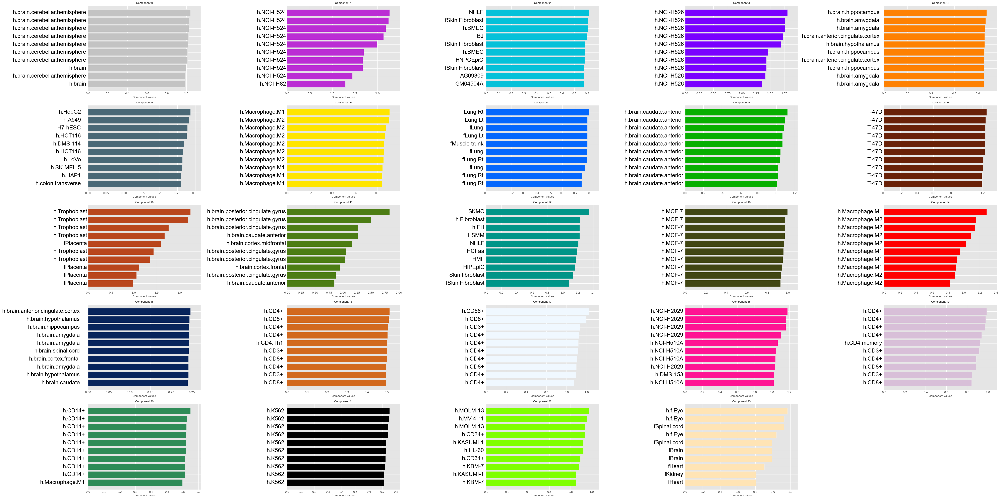

In [40]:
### Iterpretation part, adjusted x axis
plt.style.use('ggplot')
# Determine the number of rows and columns for the subplots
ncols = int(np.ceil(np.sqrt(n_components)))
nrows = int(np.ceil(n_components / ncols))

# Create a figure with subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
axes = axes.flatten()  # Flatten the axes array to easily loop through

for i_component in range(n_components):
    # Plot i_component major
    green_cut = np.argmax(decomp.Basis, axis=1) == i_component
    print("Number of samples in this category ", len(green_cut[green_cut]))

    if len(green_cut[green_cut]) >= 10: # if not, there are too few samples to count 10% top
        # Plot top 10% of this major as described:
        colors = decomp.Comp_colors
        decomp_Basis = decomp.Basis[green_cut] 

        # Get the top 10% of samples
        top_count = 10

        # Sort the samples by the value of the i_component
        sorted_indices = np.argsort(decomp_Basis[:, i_component])[-top_count:]
        sorted_matrix = decomp_Basis[sorted_indices, :]
        sorted_names = np.array(allnames)[green_cut][sorted_indices]

        # Create a horizontal stacked bar plot on the subplot
        ax = axes[i_component]
        ax.barh(np.arange(top_count), sorted_matrix[:, i_component], color=colors[i_component % len(colors)], label=f'Component {i_component}')
        
        # Adjust the x-axis range based on the data
        max_value = sorted_matrix[:, i_component].max()
        ax.set_xlim([0, max_value + 0.1 * max_value])  # set the x-axis limit to 110% of the max value

        ax.set_title(f'Component {i_component}', fontproperties=arial_font)
        
        # Add labels to the plot
        for i, name in enumerate(sorted_names):
            # Position the text to the right of the bar
            ax.text(-0.02, i, name, ha='right', va='center', color='black', fontsize=20, fontproperties=arial_font)

        # Customize the plot
        ax.set_yticks(np.arange(top_count))
        ax.set_yticklabels([])
        ax.set_xlabel('Component values', fontproperties=arial_font)

    else:
        continue

# Remove unused subplots
for i in range(i_component + 1, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout and show the figure
fig.tight_layout()
#plt.savefig(dir_path_figures + prefix +'.interpretation.10barplot.pdf', bbox_inches='tight')
plt.show()

In [124]:
colors

['#C3C3C3',
 '#BB2DD4',
 '#05C1D9',
 '#7A00FF',
 '#FE8102',
 '#4A6876',
 '#FFE500',
 '#0467FD',
 '#07AF00',
 '#692108',
 '#B9461D',
 '#4C7D14',
 '#009588',
 '#414613',
 '#FF0000',
 '#08245B',
 'chocolate',
 'aliceblue',
 'deeppink',
 'thistle',
 'seagreen',
 'black',
 'chartreuse',
 'moccasin']

In [125]:
labels = [
    "Cerebellar Hemisphere Brain Tissues",
    "NCI-H Cell Lines:",
    "Fibroblasts and Skin Related Cells",
    "NCI-H526 Cell Lines",
    "Various Brain Regions",
    "Mixed Cell Lines and Tissues",
    "Macrophage Cells",
    "Lung and Muscle Tissues",
    "Caudate Anterior Brain Regions",
    "T-47D Cell Line",
    "Placenta and Trophoblast Cells",
    "Mixed Brain Regions",
    "Fibroblasts",
    "MCF-7 Cell Line",
    "Macrophage and CD14+ Cells",
    "Various Brain Regions",
    "CD Cells",
    "CD4 and Related Cells",
    "NCI-H and Related Cell Lines",
    "CD Cells",
    "Macrophage and CD14+ Cells",
    "K562 Cell Line",
    "CD34+ and Related Cell Lines",
    "Mixed Tissues"
]

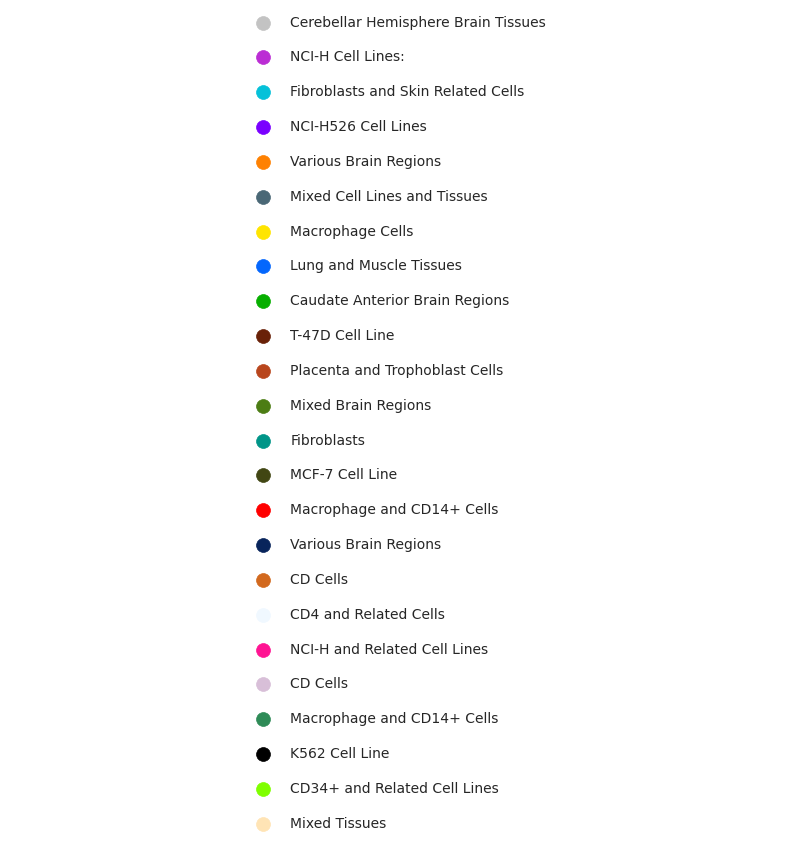

In [126]:
fig, ax = plt.subplots(figsize=(10, 8))

for color, label in zip(colors, labels):
    ax.scatter([], [], c=color, label=label, s=100)

ax.legend(loc="center", scatterpoints=1, frameon=False, bbox_to_anchor=(0.5, 0.5), labelspacing=1.5, handletextpad=1)

ax.axis('off')
plt.show()

In [140]:
n_components = decomp.Basis.shape[1]
column_to_use = "system"
categories = np.unique(metadata[column_to_use].to_list())
p_values = np.zeros((n_components, len(categories)))  # Initialize a matrix to store the p-values
categories

array(['Cardiovascular', 'Connective', 'Digestive', 'Embryonic',
       'Endocrine', 'Epithelial', 'Fetal life support', 'Germ',
       'Hematopoietic', 'Hepatic', 'Integumentary', 'Musculoskeletal',
       'Nervous', 'Reproductive', 'Respiratory', 'Urinary'], dtype='<U18')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [20:03<00:00, 50.16s/it]


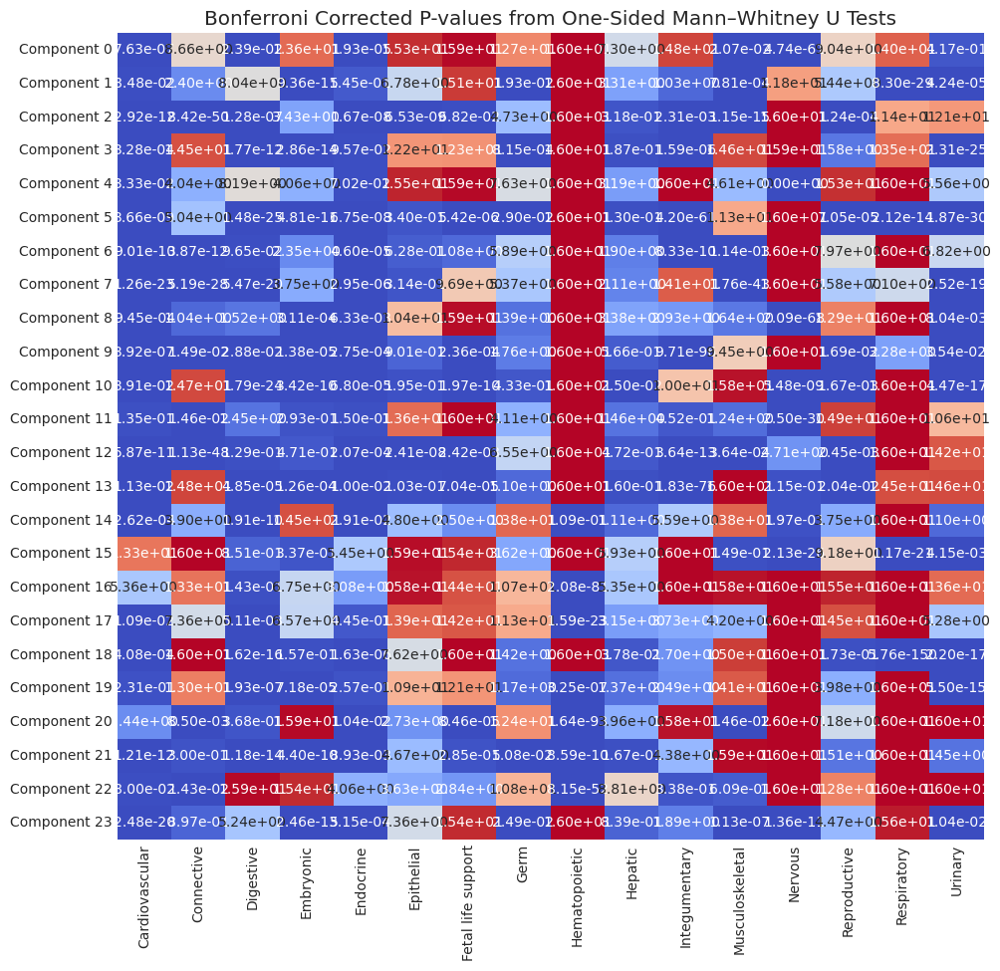

In [141]:
for i_component in tqdm(range(n_components)):
    for i_category, category in enumerate(categories):
        # Get the loadings for the current category
        category_indices = [i for i, x in enumerate(metadata[column_to_use].to_list()) if x == category]
        category_loadings = decomp.Basis[category_indices, i_component]
        
        # Get the loadings for all other categories
        other_indices = [i for i, x in enumerate(metadata[column_to_use].to_list()) if x != category]
        other_loadings = decomp.Basis[other_indices, i_component]

        if len(category_loadings) == 0 or len(other_loadings) == 0:
            print(f"Skipping Mann-Whitney U test for component {i_component} and category {category} due to zero-size arrays.")
            continue  # Skip this iteration and continue with the next one
            
        #print(i_category)

        # Perform a one-sided Mann-Whitney U test
        _, p = scipy.stats.mannwhitneyu(category_loadings, other_loadings, alternative='greater')
        p_values[i_component, i_category] = p
        

# Bonferroni Correction
corrected_p_values = p_values * len(categories)

# Create a DataFrame of the corrected p-values
p_values_df = pd.DataFrame(corrected_p_values, index=[f'Component {i}' for i in range(n_components)], columns=categories)

plt.figure(figsize=(10, 10))
sns.heatmap(p_values_df, annot=True, cmap='coolwarm', cbar=False, fmt='.2e')
plt.title('Bonferroni Corrected P-values from One-Sided Mann–Whitney U Tests')
plt.show()


In [ ]:
# Create a mask for significant p-values
significant = corrected_p_values < 0.05

# Plot heatmap
fig, ax = plt.subplots(figsize=(12, 8))
cax = ax.matshow(significant, cmap='binary')

# Set axis labels
ax.set_xticks(np.arange(len(categories)))
ax.set_yticks(np.arange(n_components))
ax.set_xticklabels(categories, rotation=45, ha="left", rotation_mode="anchor", fontproperties=arial_font)
ax.set_yticklabels(range(n_components), fontproperties=arial_font)

# Create custom legend
legend_labels = [mpatches.Patch(color='white', label='p < 0.05'), mpatches.Patch(color='black', label='p ≥ 0.05')]
legend = ax.legend(handles=legend_labels, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)  # Place legend outside

plt.xlabel('Category', fontproperties=arial_font)
plt.ylabel('Component', fontproperties=arial_font)
plt.title('Significance of Associations', fontproperties=arial_font)
plt.tight_layout()

plt.savefig(dir_path_figures + prefix + '.association.significance.png', bbox_inches='tight')
plt.show()

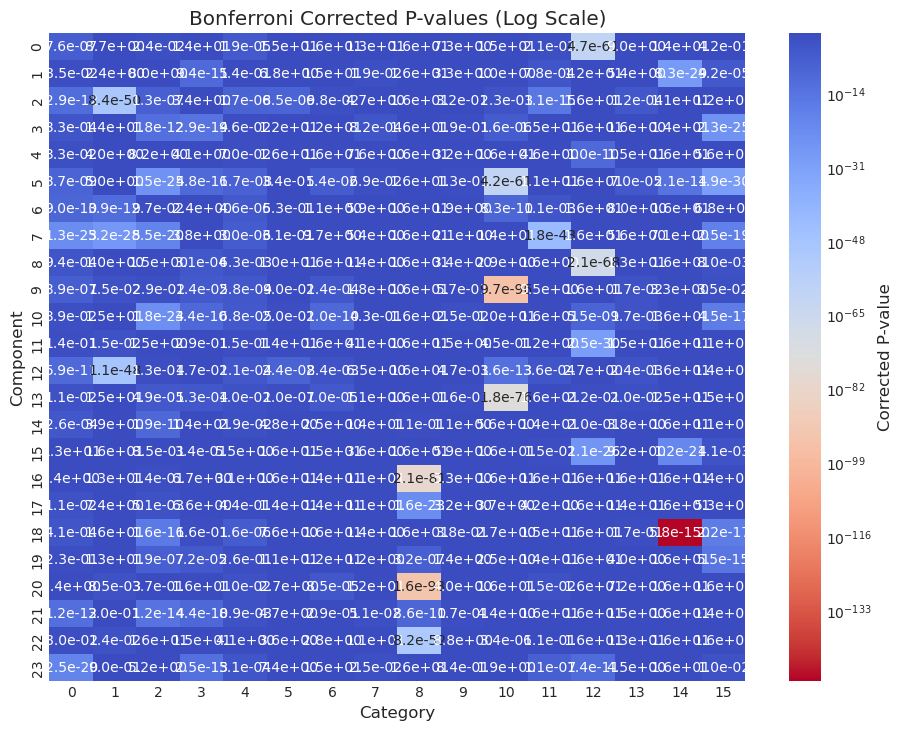

In [145]:
from matplotlib.colors import LogNorm

# Replace 0s with a small positive number (e.g., 1e-10) to avoid log(0)
corrected_p_values_nonzero = np.where(corrected_p_values==0, 1e-10, corrected_p_values)

plt.figure(figsize=(10, 8))
ax = sns.heatmap(corrected_p_values_nonzero, annot=True, fmt=".1e", cmap='coolwarm_r', 
                 norm=LogNorm(vmin=corrected_p_values_nonzero.min(), vmax=1),
                 cbar_kws={'label': 'Corrected P-value'})
plt.title('Bonferroni Corrected P-values (Log Scale)')
plt.xlabel('Category')
plt.ylabel('Component')
plt.show()


# 2a Heatmap 

### Preprocessing

In [151]:
# Identify most intense peaks

file_path = "/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/output/deseq.normalized.sf.vst.modified.npy"

try:
    matrix = np.load(file_path)
    print("Matrix loaded successfully.")
    print("Matrix shape:", matrix.shape)
    
except FileNotFoundError:
    print("File not found:", file_path)
except Exception as e:
    print("An error occurred:", e)
    
# Calculate intensity scores for each DHS by summing across samples
intensity_scores = np.sum(matrix, axis=1)
# Sort DHS indices based on intensity scores (in descending order)
sorted_indices = np.argsort(intensity_scores)[::-1]
num_dhs_to_identify = [5000, 50000, 500000]

save_directory = "/net/seq/data2/projects/aabisheva/Encode/nextflow_results/figures/"
for num_dhs in num_dhs_to_identify:
    most_intense_indices = sorted_indices[:num_dhs]
    save_path = os.path.join(save_directory, f"most_intense_indices_{num_dhs}.txt")
    
    with open(save_path, "w") as f:
        for index in most_intense_indices:
            f.write(f"{index}\n")
    
    print(f"Top {num_dhs} most intense DHS indices saved to:", save_path)

# Calculate intensity scores for each DHS by summing across samples
intensity_scores = np.sum(matrix, axis=1)
# Sort DHS indices based on intensity scores (in descending order)
sorted_indices = np.argsort(intensity_scores)[::-1]
num_dhs_to_identify = [5000, 50000, 500000]

save_directory = "/net/seq/data2/projects/aabisheva/Encode/nextflow_results/figures/"
for num_dhs in num_dhs_to_identify:
    most_intense_indices = sorted_indices[:num_dhs]
    save_path = os.path.join(save_directory, f"most_intense_indices_{num_dhs}.txt")
    
    with open(save_path, "w") as f:
        for index in most_intense_indices:
            f.write(f"{index}\n")
    
    print(f"Top {num_dhs} most intense DHS indices saved to:", save_path)

Matrix loaded successfully.
Matrix shape: (4230461, 3780)
First few elements of the matrix:
[[-0.3601837  -0.34093544 -2.03969019 -4.65066016 -4.65066016]
 [-1.25618299  1.93985497 -4.65066016 -4.65066016 -4.65066016]
 [-1.34285852 -1.10699144 -0.88814641 -4.65066016 -4.65066016]
 [-4.65066016 -4.65066016 -4.65066016 -4.65066016 -4.65066016]
 [-4.65066016 -4.65066016 -4.65066016 -4.65066016 -4.65066016]]


In [ ]:
# Sorting matrix for heatmap, by component
dhs_major_component = np.argmax(decomp.Mixture, axis=0) 
samples_major_component = np.argmax(decomp.Basis, axis=1) 

dhs_order = np.argsort(dhs_major_component*1e6 + decomp.Mixture[dhs_major_component, np.arange(decomp.Mixture.shape[1])])
samples_order = np.argsort(samples_major_component*1e6 + decomp.Basis[np.arange(decomp.Basis.shape[0]), samples_major_component])

sorted_full_bin = full_bin[dhs_order][:, samples_order]

In [ ]:
np.save(dir_path_pipeline + "bin_modified_" + "sorted_for_heatmap", sorted_full_bin)

In [ ]:
# Doesn't work on the full matrix -- crashed

plt.figure(figsize=(20,10))
sns.heatmap(sorted_full_bin, cmap="binary")
plt.savefig(dir_path_figures + prefix + '.heatmap.png', dpi=300)  
plt.close()

In [ ]:
sorted_full_bin = np.load(dir_path_pipeline + "bin_modified_sorted_for_heatmap.npy")

In [ ]:
def downsample_matrix(matrix, bin_size_x, bin_size_y):
    """
    Downsample a matrix by averaging over different window sizes for x and y axes.
    """
    shape_x = (matrix.shape[0] // bin_size_x) * bin_size_x
    shape_y = (matrix.shape[1] // bin_size_y) * bin_size_y
    matrix = matrix[:shape_x, :shape_y]
    
    downsampled = matrix.reshape(matrix.shape[0]//bin_size_x, bin_size_x, 
                                 matrix.shape[1]//bin_size_y, bin_size_y).mean(axis=(1,3))
    return downsampled

In [ ]:
# Use the function to downsample your matrix
bin_size_x = 5  # (DHSs)
bin_size_y = 1   # (samples)
downsampled_full_bin = downsample_matrix(sorted_full_bin, bin_size_x, bin_size_y)

In [ ]:
plt.figure(figsize=(15, 15))
heatmap_plot = sns.heatmap(downsampled_full_bin, cmap="viridis")  

colorbar = heatmap_plot.collections[0].colorbar
colorbar.set_label("Accessibility")
colorbar.set_ticks([0, 1])
colorbar.set_ticklabels(["Not accessible", "Chromatin accessible"])

plt.savefig(dir_path_figures + prefix + '.heatmap.png', dpi=200) 
plt.close()

### Plotting!

In [119]:
# Load most variable peaks
#peaks_indices = np.load("/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/most_variable_peaks_g_10000_g_2500.npy")

# or load most intense peaks
num_dhs = 500000
save_path = f"/net/seq/data2/projects/aabisheva/Encode/nextflow_results/figures/most_intense_indices_{num_dhs}.txt"
peaks_indices = np.loadtxt(save_path, dtype=int)
filtered_full_bin = full_bin[peaks_indices]

# Determine the major component for each filtered DHS and sample.
dhs_major_component_filtered = np.argmax(decomp.Mixture[:, peaks_indices], axis=0)  
samples_major_component = np.argmax(decomp.Basis, axis=1)

# Sort DHSs (rows) and samples (columns) based on major component and component value.
dhs_order_filtered = np.argsort(dhs_major_component_filtered*1e6 + decomp.Mixture[dhs_major_component_filtered, peaks_indices])
samples_order = np.argsort(samples_major_component*1e6 + decomp.Basis[np.arange(decomp.Basis.shape[0]), samples_major_component])

In [120]:
sorted_filtered_full_bin = filtered_full_bin[dhs_order_filtered][:, samples_order]

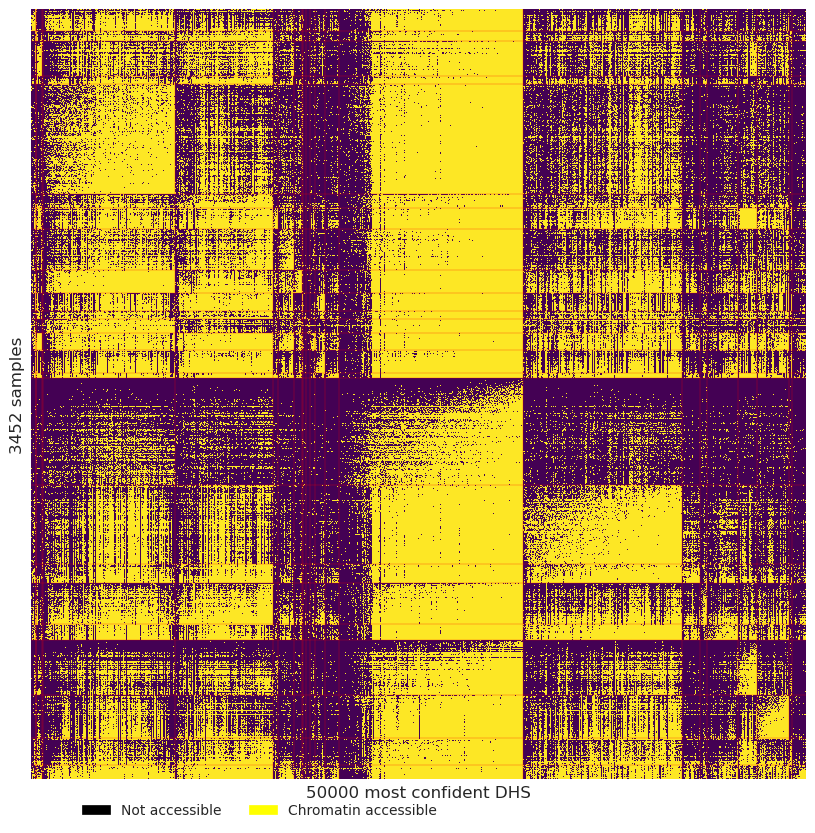

In [77]:
# Transpose the sorted data
transposed_sorted_filtered_full_bin = sorted_filtered_full_bin.T

plt.figure(figsize=(10, 10))
heatmap_plot = sns.heatmap(transposed_sorted_filtered_full_bin, cmap="viridis", cbar=False)

# Identify the indices where the major component changes for samples (which are now rows)
change_indices_samples = np.where(np.diff(samples_major_component[samples_order]))[0] + 0.5
for idx in change_indices_samples:
    heatmap_plot.axhline(idx, color='red', linewidth=0.2)

# Identify the indices where the major component changes for DHSs (which are now columns)
change_indices_dhs = np.where(np.diff(dhs_major_component_filtered[dhs_order_filtered]))[0] + 0.5
for idx in change_indices_dhs:
    heatmap_plot.axvline(idx, color='red', linewidth=0.2)
    
# Create custom patches for the legend
patch0 = mpatches.Patch(color='black', label='Not accessible')
patch1 = mpatches.Patch(color='yellow', label='Chromatin accessible')

# Add the legend to the heatmap
heatmap_plot.legend(handles=[patch0, patch1], loc='upper left', bbox_to_anchor=(0.05, -0.015), ncol=2)

# Hide the tick labels for both axes
heatmap_plot.set_xticks([])
heatmap_plot.set_yticks([])

# Set titles for the axes
num_samples = transposed_sorted_filtered_full_bin.shape[0]
num_dhs_approx = transposed_sorted_filtered_full_bin.shape[1]

heatmap_plot.set_ylabel(f"{num_samples} samples")
heatmap_plot.set_xlabel(f"{num_dhs_approx} most confident DHS")


plt.show()

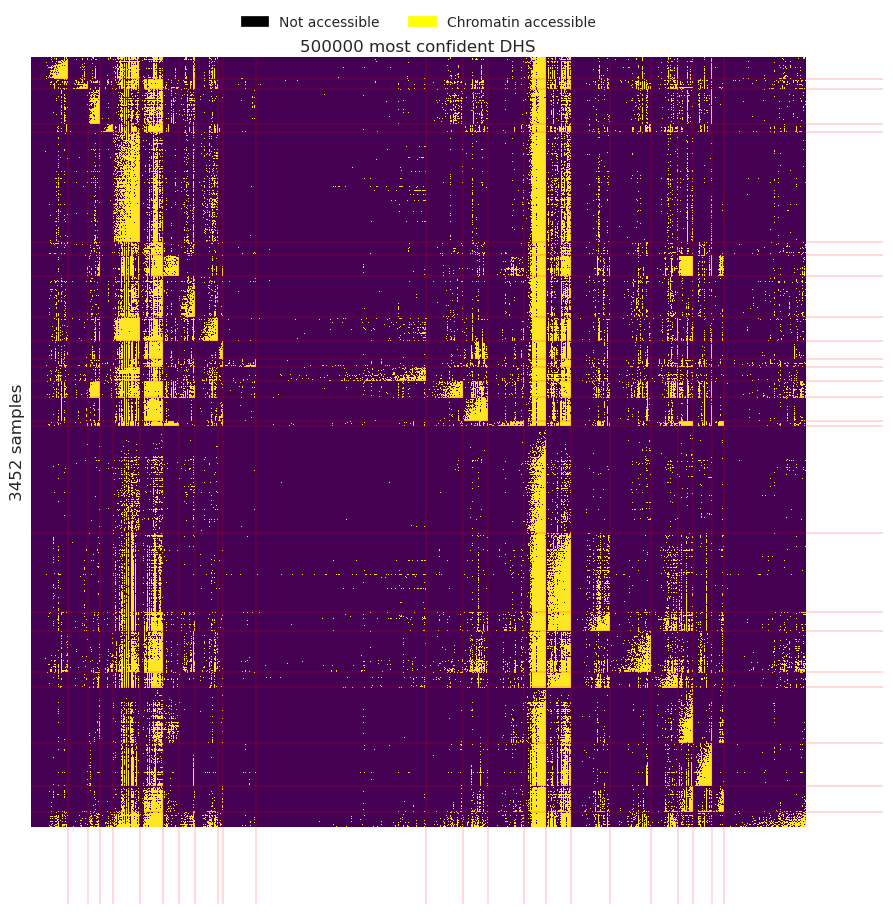

In [107]:
from matplotlib.lines import Line2D

# Transpose the sorted data
transposed_sorted_filtered_full_bin = sorted_filtered_full_bin.T

plt.figure(figsize=(10, 10))
heatmap_plot = sns.heatmap(transposed_sorted_filtered_full_bin, cmap="viridis", cbar=False)

change_indices_samples = np.where(np.diff(samples_major_component[samples_order]))[0] + 0.5
for idx in change_indices_samples:
    # Determine the x limits for the line's start and end
    x_start, x_end = heatmap_plot.get_xlim()
    line = Line2D([x_start, x_end * 1.1], [idx, idx], transform=heatmap_plot.transData, color='red', linewidth=0.2, clip_on=False)
    heatmap_plot.add_line(line)

# For vertical lines that extend to the bottom
change_indices_dhs = np.where(np.diff(dhs_major_component_filtered[dhs_order_filtered]))[0] + 0.5
for idx in change_indices_dhs:
    # Determine the y limits for the line's start and end
    y_start, y_end = heatmap_plot.get_ylim()
    line = Line2D([idx, idx], [y_start * 1.1, y_end], transform=heatmap_plot.transData, color='red', linewidth=0.2, clip_on=False)
    heatmap_plot.add_line(line)
    
# Create custom patches for the legend
patch0 = mpatches.Patch(color='black', label='Not accessible')
patch1 = mpatches.Patch(color='yellow', label='Chromatin accessible')

# Move the legend back on top of the plot
heatmap_plot.legend(handles=[patch0, patch1], loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=2)

# Hide the tick labels for both axes
heatmap_plot.set_xticks([])
heatmap_plot.set_yticks([])

# Set titles for the axes
num_samples = transposed_sorted_filtered_full_bin.shape[0]
num_dhs_approx = transposed_sorted_filtered_full_bin.shape[1]

heatmap_plot.set_ylabel(f"{num_samples} samples")

# Move the x-label to the top
heatmap_plot.xaxis.set_label_position('top')
heatmap_plot.set_xlabel(f"{num_dhs_approx} most confident DHS")

plt.show()


Ok, now we need to create a stacked bar plot for these filtred dhs

In [91]:
def swap_basis_mixture(self):
    self.Basis, self.Mixture = self.Mixture.T, self.Basis.T
    
OONMF.NMFobject.swap_basis_mixture = swap_basis_mixture

In [94]:
def filter_dhs(self, peaks_indices):
    self.Basis = self.Basis[peaks_indices, :]
    
OONMF.NMFobject.filter_dhs = filter_dhs

In [108]:
decomp.swap_basis_mixture()
print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)

decomp.filter_dhs(peaks_indices)
print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)

(4230461, 24) (24, 3452) matrixes loaded for n_components 24
(500000, 24) (24, 3452) matrixes loaded for n_components 24


This calculated ~24h and it has one fault

/net/seq/data2/projects/aabisheva/Encode/my_ipynb/Vocabulary/OONMF.py:161: RuntimeWarning: invalid value encountered in divide
  self.NormedBasis =   (self.Basis.T / np.sum(self.Basis.T, axis=0)).T


<Figure size 640x480 with 0 Axes>

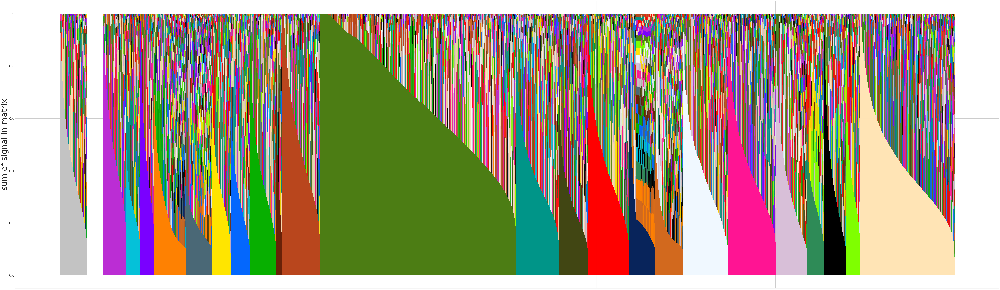

Time to plot:  64189.03743648529


In [109]:
decomp.normalize_matrices()
bar_graph_sort_order = get_barsortorder(decomp.Basis)
decomp.define_colors()

start_time = time.time()      
bar_graph_sort_order = get_barsortorder(decomp.NormedBasis)

# Normalized stacked barplot
decomp.make_continuous_stacked_bar_plot_sorted(decomp.Basis.shape[0], 
                  decomp.NormedBasis.T, 
                  dir_path_figures + prefix + '.DHS_most_intensive_peaks_cut_'+str(decomp.Basis.shape[0])+'.stacked_bar_plot.normed.pdf', 
                  barsortorder=bar_graph_sort_order)
print("Time to plot: ", time.time() - start_time)  

### 

Let's create the same picture, by reducing matrix

In [110]:
def rewrite_Basis(self, new_Basis):
    self.Basis = new_Basis
    
OONMF.NMFobject.rewrite_Basis = rewrite_Basis

In [111]:
# Reduce barsortorder to every 10th element
reduced_barsortorder = bar_graph_sort_order[::10]
decomp.rewrite_Basis(decomp.NormedBasis[reduced_barsortorder])

<Figure size 640x480 with 0 Axes>

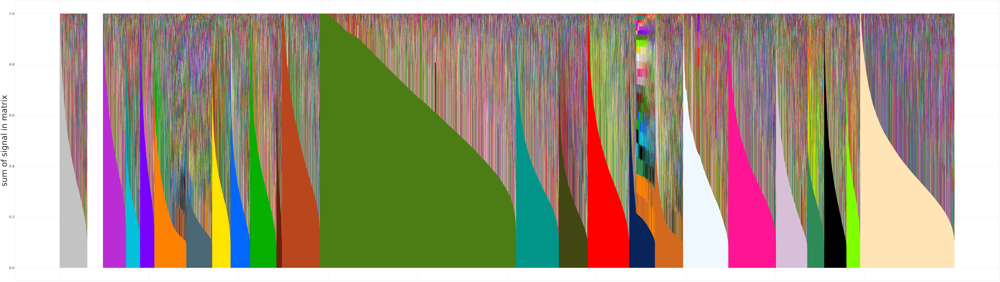

In [115]:
bar_graph_sort_order = get_barsortorder(decomp.Basis)

decomp.make_continuous_stacked_bar_plot_sorted(decomp.Basis.shape[0], 
                  decomp.Basis.T, 
                  dir_path_figures + prefix + '.DHS_most_intensive_peaks_cut_'+str(decomp.Basis.shape[0])+'_reduced.stacked_bar_plot.normed.pdf', 
                  barsortorder=bar_graph_sort_order)

<Figure size 640x480 with 0 Axes>

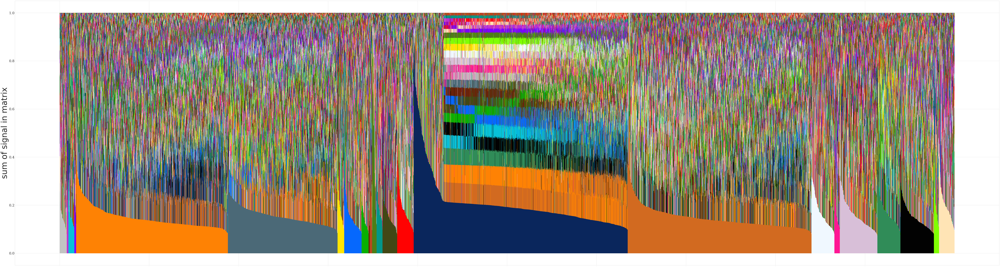

In [117]:
# Reduce barsortorder to every 10th element
reduced_barsortorder = bar_graph_sort_order[::10]
decomp.rewrite_Basis(decomp.NormedBasis[reduced_barsortorder])

bar_graph_sort_order = get_barsortorder(decomp.Basis)

decomp.make_continuous_stacked_bar_plot_sorted(decomp.Basis.shape[0], 
                  decomp.Basis.T, 
                  dir_path_figures + prefix + '.DHS_most_intensive_peaks_cut_'+str(decomp.Basis.shape[0])+'_reduced.stacked_bar_plot.normed.pdf', 
                  barsortorder=bar_graph_sort_order)